## CAPSTONE PROJECT
## The Battle of Neighborhoods
### Select Restaurant by Score
#### José Gabriel Rosas

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')



In [2]:
import pandas as pd
import requests
import urllib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.mlab as mlab
import folium
import os
import csv
import json
import numpy as np
from bs4 import BeautifulSoup
print('Start JGR')

Start JGR


In [3]:
from sklearn.preprocessing import StandardScaler
from geopy.geocoders import Nominatim
from pandas.io.json import json_normalize
from sklearn.cluster import KMeans

## 1. New York Restaurants

When visiting New York, for sure you are going to look for something different to eat and try some international cuisine. But, if you don't know where to look and want to be sure that it is well rated, but not just because of likes in social media, then, there is a study from the Department of Health and Mental Hygiene from New York city, that grades the restaurants.

The final objective looks for the type of cuisine by Neighborhood and its grades, so you can visit with confidence the restaurant you liked.

#### DOHMH New York City Restaurant Inspection Results

The following Inspection Results from the DOHMH (Department of Health and Mental Hygiene from New York city), is defined in order to look for the best restaurants by type of cuisine by Borough.

Find below a small description from the DOHMH.

"The dataset contains every sustained or not yet adjudicated violation citation from every full or special program inspection conducted up to three years prior to the most recent inspection for restaurants and college cafeterias in an active status on the RECORD DATE (date of the data pull). When an inspection results in more than one violation, values for associated fields are repeated for each additional violation record. Establishments are uniquely identified by their CAMIS (record ID) number."

## 2. Gathering Data
### 2.1 Data from DOHMH (Department of Health and Mental Hygiene from New York city)

The data has been taken from the link below and saved as an csv file

https://data.cityofnewyork.us/Health/DOHMH-New-York-City-Restaurant-Inspection-Results/43nn-pn8j/data

#### The file has been downloaded and read as Dataframe

The Dataframe has 384,487 rows and 18 columns, but it is required to do some clean up of the file to get just the information for the purpose of this analysis.

In [4]:
rest=pd.read_csv('New_York_Restaurant_Inspection_Results.csv')
rest.head()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,VIOLATION CODE,VIOLATION DESCRIPTION,CRITICAL FLAG,SCORE,GRADE,GRADE DATE,RECORD DATE,INSPECTION TYPE
0,41638031,MAMAJUANA CAFE,BRONX,3233,EAST TREMONT AVENUE,10461.0,7188248400,Spanish,12/21/2017,Violations were cited in the following area(s).,10F,Non-food contact surface improperly constructe...,Not Critical,9.0,A,12/21/2017,04/01/2019,Cycle Inspection / Re-inspection
1,50045811,BROTHERS CREPES,QUEENS,4202,30TH AVE,11103.0,7186060494,"Juice, Smoothies, Fruit Salads",10/04/2018,Violations were cited in the following area(s).,10F,Non-food contact surface improperly constructe...,Not Critical,9.0,A,10/04/2018,04/01/2019,Cycle Inspection / Initial Inspection
2,40739444,DUNKIN' DONUTS,QUEENS,5602,METROPOLITAN AVENUE,11385.0,7183813200,Donuts,08/24/2016,Violations were cited in the following area(s).,04L,Evidence of mice or live mice present in facil...,Critical,11.0,A,08/24/2016,04/01/2019,Cycle Inspection / Re-inspection
3,50058559,PRET A MANGER,MANHATTAN,299,7TH AVE,10001.0,6467280505,American,08/28/2017,Violations were cited in the following area(s).,16E,Caloric content range (minimum to maximum) not...,Not Critical,NaN,NaN,NaN,04/01/2019,Calorie Posting / Initial Inspection
4,50069855,FERRY HOUSE CAFE,MANHATTAN,PIER 11,SOUTH ST,10005.0,9175363918,CafÃ©/Coffee/Tea,11/30/2017,Violations were cited in the following area(s).,05H,"No facilities available to wash, rinse and san...",Critical,94.0,C,11/30/2017,04/01/2019,Pre-permit (Operational) / Re-inspection


In [5]:
print(rest.shape)

(384487, 18)


#### Drop the columns that aren't useful for this purpose

In [6]:
rest=rest.drop(['CAMIS','PHONE','BUILDING','INSPECTION DATE','ACTION','VIOLATION CODE','VIOLATION DESCRIPTION','CRITICAL FLAG','GRADE DATE','RECORD DATE','INSPECTION TYPE'], axis=1)
rest.head()

,DBA,BORO,STREET,ZIPCODE,CUISINE DESCRIPTION,SCORE,GRADE
0,MAMAJUANA CAFE,BRONX,EAST TREMONT AVENUE,10461.0,Spanish,9.0,A
1,BROTHERS CREPES,QUEENS,30TH AVE,11103.0,"Juice, Smoothies, Fruit Salads",9.0,A
2,DUNKIN' DONUTS,QUEENS,METROPOLITAN AVENUE,11385.0,Donuts,11.0,A
3,PRET A MANGER,MANHATTAN,7TH AVE,10001.0,American,NaN,NaN
4,FERRY HOUSE CAFE,MANHATTAN,SOUTH ST,10005.0,CafÃ©/Coffee/Tea,94.0,C


In [7]:
rest.shape

(384487, 7)

#### Sort by Borough, Zipcode, Type of Cuisine and Score of Restaurant

In [8]:
rest=rest.sort_values(['BORO','ZIPCODE','CUISINE DESCRIPTION','SCORE'], ascending=[True,True,True,False])
rest.head()

,DBA,BORO,STREET,ZIPCODE,CUISINE DESCRIPTION,SCORE,GRADE
24166,NABAYA AFRICAN AMERICAN RESTUARANT,BRONX,MELROSE AVE,10451.0,African,55.0,NaN
79128,NABAYA AFRICAN AMERICAN RESTUARANT,BRONX,MELROSE AVE,10451.0,African,55.0,NaN
125062,NABAYA AFRICAN AMERICAN RESTUARANT,BRONX,MELROSE AVE,10451.0,African,55.0,NaN
242243,NABAYA AFRICAN AMERICAN RESTUARANT,BRONX,MELROSE AVE,10451.0,African,55.0,NaN
259089,NABAYA AFRICAN AMERICAN RESTUARANT,BRONX,MELROSE AVE,10451.0,African,55.0,NaN


In [9]:
rest.shape

(384487, 7)

#### Delete restaurant duplicates

Now the Dataframe has been cleaned a little bit, but it can be improved. When some of the columns were deleted, then with the remaining ones, there are many duplicates, so those duplicates are going to be removed.
So, from 384,487 rows, now there are 21,292 rows with cleaner data.

In [10]:
rest=rest.drop_duplicates(['DBA'], keep='last', inplace=False)
rest.head()

,DBA,BORO,STREET,ZIPCODE,CUISINE DESCRIPTION,SCORE,GRADE
345824,BALIMAYA RESTAURANT,BRONX,3 AVENUE,10451.0,African,10.0,A
124291,RESTAURANT DELICES DES SAVEURS,BRONX,MORRIS AVE,10451.0,African,NaN,NaN
296376,NABAYA AFRICAN AMERICAN RESTUARANT,BRONX,MELROSE AVE,10451.0,African,NaN,NaN
266210,YANKEE TAVERN,BRONX,EAST 161 STREET,10451.0,American,12.0,A
285479,STAN'S SPORTS BAR,BRONX,RIVER AVENUE,10451.0,American,11.0,A


In [11]:
print(rest.shape)

(21292, 7)


#### Delete not scored
We don't really want to have in our dataset those restaurants that haven't been rated yet, we do really want to know their grades, so those with NaN in their Scores, are going to be dropped.

So from those 21,292 rows, the dataset now has 12,154. A whole new different quantity from the amount of rows at the beginning.

In [12]:
rest=rest.dropna(axis=0, how='any')
rest.head()

,DBA,BORO,STREET,ZIPCODE,CUISINE DESCRIPTION,SCORE,GRADE
345824,BALIMAYA RESTAURANT,BRONX,3 AVENUE,10451.0,African,10.0,A
266210,YANKEE TAVERN,BRONX,EAST 161 STREET,10451.0,American,12.0,A
285479,STAN'S SPORTS BAR,BRONX,RIVER AVENUE,10451.0,American,11.0,A
320150,BULLPEN DELI TWIN DONUT,BRONX,E 161ST ST,10451.0,American,11.0,A
64583,BLUE POINT BLEACHERS BAR 237,BRONX,E 161ST ST,10451.0,American,10.0,A


In [13]:
rest.shape

(11216, 7)

#### Rename Columns

This is the Dataframe containing the name of the restaurant, its Borough, Zip code, Type of Cuisine and the score.

It is very useful to be consistent and always use the same way to name the columns and type of data.

##### rest.name Dataframe

This is the final result of this first step

In [14]:
rest.rename(columns = {'DBA':'RESTAURANT'}, inplace = True)
rest.rename(columns = {'BORO':'BOROUGH'}, inplace = True)
rest.rename(columns = {'CUISINE DESCRIPTION':'CUISINE'}, inplace = True)
print('rest.name Dataframe')
rest.head()

rest.name Dataframe


,RESTAURANT,BOROUGH,STREET,ZIPCODE,CUISINE,SCORE,GRADE
345824,BALIMAYA RESTAURANT,BRONX,3 AVENUE,10451.0,African,10.0,A
266210,YANKEE TAVERN,BRONX,EAST 161 STREET,10451.0,American,12.0,A
285479,STAN'S SPORTS BAR,BRONX,RIVER AVENUE,10451.0,American,11.0,A
320150,BULLPEN DELI TWIN DONUT,BRONX,E 161ST ST,10451.0,American,11.0,A
64583,BLUE POINT BLEACHERS BAR 237,BRONX,E 161ST ST,10451.0,American,10.0,A


### 2.2 ZIP Code Definitions of New York City Neighborhoods

The last dataset, rest, has the Borough name and its ZIP codes, but we want to know a little more detail about the neighborhood and the geographical coordinates, so we can use the Foresquare information.

For this purpose, from the Department of Health of New York State, I copied the table, organized it in Excel and the converted it into a CSV file. It has some behind scenes manipulation in Excel to get it converted in this file.

https://www.health.ny.gov/statistics/cancer/registry/appendix/neighborhoods.htm

Below, you'll find the CSV file and how it was manipulated to get the ZIP codes by each Neighborhood, so they can be linked with the Restaurant Names, rest.names, Dataframe

In [15]:
nyzips=pd.read_csv('NY Bogorughs zip codes.csv')
nyzips.head()

,Borough,Neighborhood,zip1,zip2,zip3,zip4,zip5,zip6,zip7,zip8,zip9
0,Bronx,Central Bronx,10453,10457.0,10460.0,NaN,NaN,NaN,NaN,NaN,NaN
1,Bronx,Bronx Park and Fordham,10458,10467.0,10468.0,NaN,NaN,NaN,NaN,NaN,NaN
2,Bronx,High Bridge and Morrisania,10451,10452.0,10456.0,NaN,NaN,NaN,NaN,NaN,NaN
3,Bronx,Hunts Point and Mott Haven,10454,10455.0,10459.0,10474.0,NaN,NaN,NaN,NaN,NaN
4,Bronx,Kingsbridge and Riverdale,10463,10471.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
nyzipsT=pd.melt(nyzips, id_vars=['Borough','Neighborhood'],value_vars=['zip1','zip2','zip3','zip4','zip5','zip6','zip7','zip8','zip9'])
nyzipsT.tail()

,Borough,Neighborhood,variable,value
373,Queens,West Queens,zip9,NaN
374,Staten Island,Port Richmond,zip9,NaN
375,Staten Island,South Shore,zip9,NaN
376,Staten Island,Stapleton and St. George,zip9,NaN
377,Staten Island,Mid-Island,zip9,NaN


In [17]:
nyzipsT=nyzipsT.dropna(axis=0, how='any')
nyzipsT.tail()

,Borough,Neighborhood,variable,value
288,Queens,Southwest Queens,zip7,11420.0
289,Queens,West Queens,zip7,11378.0
329,Queens,Southeast Queens,zip8,11428.0
330,Queens,Southwest Queens,zip8,11421.0
371,Queens,Southeast Queens,zip9,11429.0


In [18]:
nyzipsT.rename(columns = {'value':'ZIPCODE'}, inplace = True)
#nyzipsT=nyzipsT.drop(['variable'],axis=1)
nyzipsT.head()

,Borough,Neighborhood,variable,ZIPCODE
0,Bronx,Central Bronx,zip1,10453.0
1,Bronx,Bronx Park and Fordham,zip1,10458.0
2,Bronx,High Bridge and Morrisania,zip1,10451.0
3,Bronx,Hunts Point and Mott Haven,zip1,10454.0
4,Bronx,Kingsbridge and Riverdale,zip1,10463.0


### 2.3 Get the coordinates by each ZIP code

Now we have the Borough name, the Neighborhood and the ZIP codes, let's look for the coordinates of each one.

From the US Census Bureau, Gazetteer Files I downloaded the file and save it as csv

ZIP Code Tabulation Areas
https://www.census.gov/geographies/reference-files/2017/geo/gazetter-file.html

zip file
https://www2.census.gov/geo/docs/maps-data/data/gazetteer/2017_Gazetteer/2017_Gaz_zcta_national.zip

In [19]:
zipcoor=pd.read_csv('ZIP Codes and coordinates.csv')
zipcoor.head()

,GEOID,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
0,601,166659749,799292,64.348,0.309,18.180555,-66.749961
1,602,79307535,4428429,30.621,1.710,18.361945,-67.175597
2,603,81887185,181411,31.617,0.070,18.455183,-67.119887
3,606,109579993,12487,42.309,0.005,18.158327,-66.932928
4,610,93013427,4172059,35.913,1.611,18.295366,-67.125135


In [20]:
zipcoor.rename(columns={'GEOID':'ZIPCODE'},inplace=True)
zipcoor.rename(columns={'INTPTLAT':'LATITUDE'},inplace=True)
zipcoor.rename(columns={'INTPTLONG':'LONGITUDE'},inplace=True)
zipcoor=zipcoor.drop(['ALAND','AWATER','ALAND_SQMI','AWATER_SQMI'], axis=1)
zipcoor.head()

,ZIPCODE,LATITUDE,LONGITUDE
0,601,18.180555,-66.749961
1,602,18.361945,-67.175597
2,603,18.455183,-67.119887
3,606,18.158327,-66.932928
4,610,18.295366,-67.125135


### 2.4 MERGING

Now it's time to merge all the information.

##### Merge nyzips with zipcoor

In [21]:
dfout=pd.merge(nyzipsT,zipcoor)
dfout.head()

,Borough,Neighborhood,variable,ZIPCODE,LATITUDE,LONGITUDE
0,Bronx,Central Bronx,zip1,10453.0,40.852820,-73.912310
1,Bronx,Bronx Park and Fordham,zip1,10458.0,40.862529,-73.888159
2,Bronx,High Bridge and Morrisania,zip1,10451.0,40.820454,-73.925066
3,Bronx,Hunts Point and Mott Haven,zip1,10454.0,40.805492,-73.916604
4,Bronx,Kingsbridge and Riverdale,zip1,10463.0,40.880678,-73.906540


##### Merge the last merge with the restaurant dataframe

In [22]:
merged=pd.merge(dfout,rest)
merged.head()

,Borough,Neighborhood,variable,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,BOROUGH,STREET,CUISINE,SCORE,GRADE
0,Bronx,Central Bronx,zip1,10453.0,40.85282,-73.91231,GALAGALA NY RESTAURANT,BRONX,E 175TH ST,African,3.0,A
1,Bronx,Central Bronx,zip1,10453.0,40.85282,-73.91231,BEVERLY HILL MANOR,BRONX,JEROME AVE,American,42.0,Not Yet Graded
2,Bronx,Central Bronx,zip1,10453.0,40.85282,-73.91231,MI BAKERY & CAFE,BRONX,W 183RD ST,Bakery,6.0,A
3,Bronx,Central Bronx,zip1,10453.0,40.85282,-73.91231,MOUNT HOPE BAKERY,BRONX,MOUNT HOPE PL,Bakery,4.0,P
4,Bronx,Central Bronx,zip1,10453.0,40.85282,-73.91231,MI CASA BAKERY & COFFEE SHOP,BRONX,GRAND CONCOURSE,Bakery,3.0,A


Drop the columns that we don't want. It is twice the Borough column.

The variable column, was just a remaining column from the 'melting' process, but it is useless.

In [23]:
merged=merged.drop(['variable','BOROUGH'],axis=1)

### 2.5 Unified Dataframe and Map
Show the last dataframe, the one that's going to be used in the map.

Now it has 10,884 rows and 10 rearranged columns

In [24]:
merged.head()

,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE
0,Bronx,Central Bronx,10453.0,40.85282,-73.91231,GALAGALA NY RESTAURANT,E 175TH ST,African,3.0,A
1,Bronx,Central Bronx,10453.0,40.85282,-73.91231,BEVERLY HILL MANOR,JEROME AVE,American,42.0,Not Yet Graded
2,Bronx,Central Bronx,10453.0,40.85282,-73.91231,MI BAKERY & CAFE,W 183RD ST,Bakery,6.0,A
3,Bronx,Central Bronx,10453.0,40.85282,-73.91231,MOUNT HOPE BAKERY,MOUNT HOPE PL,Bakery,4.0,P
4,Bronx,Central Bronx,10453.0,40.85282,-73.91231,MI CASA BAKERY & COFFEE SHOP,GRAND CONCOURSE,Bakery,3.0,A


In [25]:
merged.shape

(10884, 10)

In [26]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7308619, -73.9871558.


In [27]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(merged['LATITUDE'], merged['LONGITUDE'], merged['Borough'], merged['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    #label = folium.Popup(label, parse_html=True)
    label = folium.Popup(label)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        #parse_html=False
        ).add_to(map_newyork)  
    
map_newyork

## 3. Selecting Cuisine

### How Many Restaurants, Types of Cuisine and Score Distribution by Borough

A brief analyisis of what you can find in each Borough.

First, make a Dataframe to summarize the results, and after that, start to make a decision

In [28]:
merged2 = merged.groupby(['Borough']).nunique() 
merged2

,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE
Borough,,,,,,,,,,
Bronx,1,7,25,25,25,992,327,47,36,6
Brooklyn,1,11,36,36,36,2529,537,73,56,6
Manhattan,1,10,43,43,43,4301,849,74,60,6
Queens,1,10,58,58,58,2587,493,72,53,6
Staten Island,1,4,12,12,12,475,134,48,30,6


In [29]:
#Delete some columns that we don't required and specially a repeated Name in the Index column and one of the columns
merged2=merged2.drop(['Borough','Neighborhood','ZIPCODE','LATITUDE','LONGITUDE','STREET','SCORE','GRADE'], axis=1)
#A relation showing how many restaurants by type of Cuisine
merged2['Restaurant/Cuisine'] = merged2['RESTAURANT']/merged2['CUISINE'] 
merged2

,RESTAURANT,CUISINE,Restaurant/Cuisine
Borough,,,
Bronx,992,47,21.106383
Brooklyn,2529,73,34.643836
Manhattan,4301,74,58.121622
Queens,2587,72,35.930556
Staten Island,475,48,9.895833


So it is showing that Manhattan has the maximum amount of restaurants with 4301 and Staten Island the minimum with 475.

Manhattan, Brooklyn and Queens, mainly have the same amount of types of Cuisines,  74,73,72 respectively.

And Bronx and Staten Island have mainly the same amount, 47 and 48

Let's look at those findings in a visual way

In [30]:
%matplotlib inline

How many restaurants per Borough and how many types of cuisines per Borough

<Figure size 648x216 with 0 Axes>

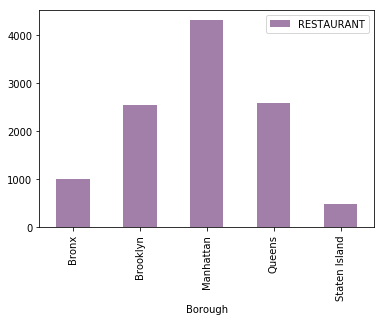

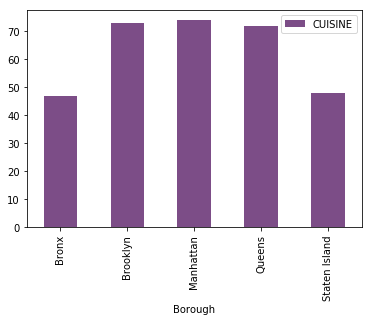

In [31]:
plt.figure(1, figsize=(9,3))
merged2[['RESTAURANT']].plot.bar(alpha=0.5,cmap='viridis')
merged2[['CUISINE']].plot.bar(alpha=0.7,cmap='viridis')

#### Select the type of Cuisine that we want

List the type of cuisines and select 5 types to analyze the scores of their restaurants.

First identify the different types of cuisines

In [32]:
merged.CUISINE.unique()

array(['African', 'American', 'Bakery', 'Caribbean', 'Chinese',
       'Delicatessen', 'Juice, Smoothies, Fruit Salads',
       'Latin (Cuban, Dominican, Puerto Rican, South & Central American)',
       'Mexican', 'Pizza', 'Pizza/Italian', 'Seafood', 'Spanish',
       'Barbecue',
       'Bottled beverages, including water, sodas, juices, etc.',
       'CafÃ©/Coffee/Tea', 'Chicken', 'Eastern European',
       'Ice Cream, Gelato, Yogurt, Ices', 'Italian', 'Japanese', 'Other',
       'Sandwiches/Salads/Mixed Buffet', 'Soul Food', 'Bagels/Pretzels',
       'Sandwiches', 'Turkish', 'Steak', 'Tex-Mex', 'Asian', 'Greek',
       'Indian', 'Jewish/Kosher', 'Thai', 'Hawaiian', 'Chinese/Cuban',
       'Hamburgers', 'Irish', 'Czech', 'Donuts', 'Egyptian',
       'Mediterranean', 'Middle Eastern', 'Moroccan', 'Polish',
       'Chinese/Japanese', 'Russian', 'Peruvian',
       'Vietnamese/Cambodian/Malaysia', 'French', 'Cajun', 'Continental',
       'Pakistani', 'Salads', 'Tapas', 'Hotdogs', 'Korean'

##### Selection

If somebody wants to try international cuisines, New York is the place. 

But we don't want to choose from ten thousand options, so let's select 5 types that you don't usually eat. 

For this case, these are the selected cuisines: 

##### African, Eastern European, Turkish, Creole, Afghan

Create a Dataframe just with the types of cuisines selected.

So, we got just 119 rows

In [33]:
value_list=['African', 'Eastern European', 'Turkish', 'Creole', 'Afghan']

selection = merged[merged.CUISINE.isin(value_list)]
print(selection.shape)
selection.head()

(119, 10)


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE
0,Bronx,Central Bronx,10453.0,40.852820,-73.912310,GALAGALA NY RESTAURANT,E 175TH ST,African,3.0,A
37,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,MB RESTAURANT,WEBSTER AVE,African,5.0,A
83,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CAKOR RESTAURANT,EAST 186 STREET,Eastern European,5.0,A
84,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CKA KA QELLU,HUGHES AVE,Eastern European,3.0,A
120,Bronx,High Bridge and Morrisania,10451.0,40.820454,-73.925066,BALIMAYA RESTAURANT,3 AVENUE,African,10.0,A


#### Grouping chart

How is the distribution amount of restaurants per Borough

In [34]:
selection2 = selection.groupby(['CUISINE','Borough']).nunique() 
selection2

Borough  Neighborhood  ZIPCODE  LATITUDE  \
CUISINE          Borough                                                   
Afghan           Brooklyn             1             1        1         1   
                 Manhattan            1             3        3         3   
                 Queens               1             4        4         4   
African          Bronx                1             4        9         9   
                 Brooklyn             1             4        6         6   
                 Manhattan            1             4        6         6   
                 Queens               1             2        2         2   
                 Staten Island        1             1        1         1   
Creole           Brooklyn             1             1        3         3   
                 Manhattan            1             1        1         1   
                 Queens               1             1        2         2   
Eastern European Bronx                1             3        3         3   
                 Brooklyn             1             3        6         6   
                 Manhattan            1             5        7         7   
                 Queens               1             2        3         3   
                 Staten Island        1             1        1         1   
Turkish          Bronx                1             1        1         1   
                 Brooklyn             1             6        9         9   
                 Manhattan            1             5       10        10   
                 Queens               1             4        4         4   
                 Staten Island        1             2        2         2   

                                LONGITUDE  RESTAURANT  STREET  CUISINE  SCORE  \
CUISINE          Borough                                                        
Afghan           Brooklyn               1           1       1        1      1   
                 Manhattan              3           3       3        1      3   
                 Queens                 4           5       5        1      4   
African          Bronx                  9          13      12        1      9   
                 Brooklyn               6           6       6        1      4   
                 Manhattan              6           6       6        1      6   
                 Queens                 2           2       2        1      2   
                 Staten Island          1           1       1        1      1   
Creole           Brooklyn               3           4       4        1      4   
                 Manhattan              1           1       1        1      1   
                 Queens                 2           2       2        1      2   
Eastern European Bronx                  3           4       4        1      3   
                 Brooklyn               6          13      11        1      7   
                 Manhattan              7           9       9        1      7   
                 Queens                 3           5       5        1      5   
                 Staten Island          1           3       3        1      2   
Turkish          Bronx                  1           1       1        1      1   
                 Brooklyn               9          15      11        1      8   
                 Manhattan             10          18      17        1      9   
                 Queens                 4           5       4        1      4   
                 Staten Island          2           2       2        1      2   

                                GRADE  
CUISINE          Borough               
Afghan           Brooklyn           1  
                 Manhattan          2  
                 Queens             3  
African          Bronx              2  
                 Brooklyn           2  
                 Manhattan          1  
                 Queens             2  
                 Staten Island      1  
Creole           Br

In [35]:
selection['SCORE'].describe()

count    119.000000
mean       8.966387
std       11.184078
min        0.000000
25%        5.000000
50%        7.000000
75%       10.000000
max       94.000000
Name: SCORE, dtype: float64

##### In which Borough is the majority of each type of the cuisines selected

Text(0.5, 1.0, 'QUANTITY OF RESTAURANTS BY TYPE BY BOROUGH ')

<Figure size 1080x576 with 0 Axes>

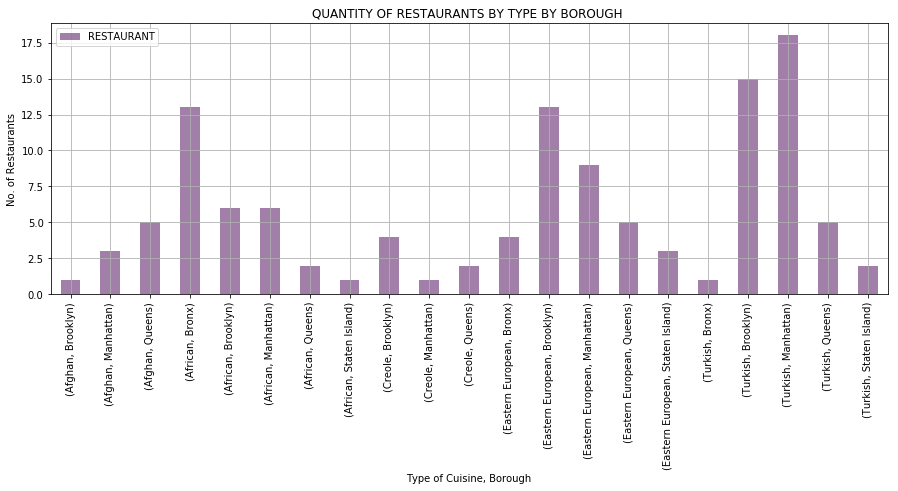

In [36]:
plt.figure(1, figsize=(15,8))
plt.rcParams['figure.figsize']=(15,5)
selection2[['RESTAURANT']].plot.bar(alpha=0.5,cmap='viridis')
plt.xlabel('Type of Cuisine, Borough')
plt.ylabel('No. of Restaurants')
plt.grid(True)
plt.title('QUANTITY OF RESTAURANTS BY TYPE BY BOROUGH ')

### Where are the selected restaurants?
##### So, based on the last chart, the majority of restaurants of each cuisine are in:
    
Afghan in Queens

African in Bronx

Creole in Brooklyn

Eastern European in Brooklyn

Turkish in Manhattan

Map of New York with the new distribution of restaurants with the selected cuisines

In [37]:
map_selection = folium.Map(location=[latitude, longitude], zoom_start=11)

for lat, lng, borough, neighborhood in zip(selection['LATITUDE'], selection['LONGITUDE'], selection['Borough'], selection['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label)
    folium.CircleMarker(
        [lat, lng],
        radius=7,
        popup=label,
        color='black',
        fill=True,
        fill_color='#318cc',
        fill_opacity=0.5,
        ).add_to(map_selection)  
    
map_selection

### 4. CLUSTERING 

Score by Restaurant

In [38]:
clustering=selection.drop(['Borough','Neighborhood','ZIPCODE','LATITUDE','LONGITUDE','RESTAURANT','STREET','CUISINE','GRADE'], axis = 1)
clustering.head()

,SCORE
0,3.0
37,5.0
83,5.0
84,3.0
120,10.0


In [39]:
X = clustering.values[:,0:]
X = np.nan_to_num(X)
cluster_dataset = StandardScaler().fit_transform(X)
cluster_dataset

array([[-5.35727163e-01],
       [-3.56145382e-01],
       [-3.56145382e-01],
       [-5.35727163e-01],
       [ 9.28090720e-02],
       [ 9.28090720e-02],
       [ 3.62181744e-01],
       [ 9.28090720e-02],
       [ 3.01818120e-03],
       [-1.76563600e-01],
       [-1.76563600e-01],
       [-6.25518054e-01],
       [-1.76563600e-01],
       [-3.56145382e-01],
       [ 2.72390854e-01],
       [ 2.72390854e-01],
       [ 9.28090720e-02],
       [-4.45936273e-01],
       [-4.45936273e-01],
       [ 9.28090720e-02],
       [ 3.01818120e-03],
       [-3.56145382e-01],
       [-4.45936273e-01],
       [ 2.72390854e-01],
       [-1.76563600e-01],
       [ 7.63524390e+00],
       [ 9.28090720e-02],
       [ 3.01818120e-03],
       [-1.76563600e-01],
       [ 9.28090720e-02],
       [-5.35727163e-01],
       [-8.67727096e-02],
       [ 9.28090720e-02],
       [ 3.62181744e-01],
       [-1.76563600e-01],
       [-1.76563600e-01],
       [-1.76563600e-01],
       [ 9.28090720e-02],
       [ 3.4

In [40]:
num_clusters = 5

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=12)
k_means.fit(cluster_dataset)
labels = k_means.labels_

print(labels)

[2 2 2 2 0 0 0 0 4 4 4 2 4 2 0 0 0 2 2 0 4 2 2 0 4 1 0 4 4 0 2 4 0 0 4 4 4
 0 3 4 0 2 2 0 2 4 0 2 4 0 2 4 4 4 2 2 4 2 2 4 4 0 2 0 2 2 2 2 4 2 0 4 4 2
 4 4 4 4 2 0 4 2 0 0 0 4 2 0 0 4 4 2 0 0 0 4 4 2 2 2 1 4 0 0 2 0 0 0 4 0 0
 2 2 2 0 4 4 4 4]


In [46]:
selection["Labels"] = labels
print('Shape of clustering dataframe',clustering.shape)
selection.head()

Shape of clustering dataframe (119, 2)


C:\Users\joseg\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE,Labels
0,Bronx,Central Bronx,10453.0,40.852820,-73.912310,GALAGALA NY RESTAURANT,E 175TH ST,African,3.0,A,2
37,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,MB RESTAURANT,WEBSTER AVE,African,5.0,A,2
83,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CAKOR RESTAURANT,EAST 186 STREET,Eastern European,5.0,A,2
84,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CKA KA QELLU,HUGHES AVE,Eastern European,3.0,A,2
120,Bronx,High Bridge and Morrisania,10451.0,40.820454,-73.925066,BALIMAYA RESTAURANT,3 AVENUE,African,10.0,A,0


The new dataframe including a column with the cluster labels.

Now identify the scores by cluster

In [42]:
selection.head()

,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE
0,Bronx,Central Bronx,10453.0,40.852820,-73.912310,GALAGALA NY RESTAURANT,E 175TH ST,African,3.0,A
37,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,MB RESTAURANT,WEBSTER AVE,African,5.0,A
83,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CAKOR RESTAURANT,EAST 186 STREET,Eastern European,5.0,A
84,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CKA KA QELLU,HUGHES AVE,Eastern European,3.0,A
120,Bronx,High Bridge and Morrisania,10451.0,40.820454,-73.925066,BALIMAYA RESTAURANT,3 AVENUE,African,10.0,A


#### Average score by cluster

In [47]:
selection.groupby('Labels').mean()

,ZIPCODE,LATITUDE,LONGITUDE,SCORE
Labels,,,,
0,10754.631579,40.708543,-73.949242,11.052632
1,11319.000000,40.672272,-73.857820,85.000000
2,10616.131579,40.745789,-73.934117,3.394737
3,10457.000000,40.847162,-73.898663,47.000000
4,10703.100000,40.692616,-73.956178,7.525000


### Map of Clusters

In [48]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(num_clusters)
ys = [i + x + (i*x)**2 for i in range(num_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(selection['LATITUDE'], selection['LONGITUDE'], selection['Neighborhood'], selection['Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### Cluster 0 
40 Restaurants

Average Score 7.5

In [49]:
cluster_0=selection.loc[selection['Labels'] ==0]
print('Shape Cluster 0',cluster_0.shape)
cluster_0.head()

Shape Cluster 0 (38, 11)


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE,Labels
120,Bronx,High Bridge and Morrisania,10451.0,40.820454,-73.925066,BALIMAYA RESTAURANT,3 AVENUE,African,10.0,A,0
203,Bronx,High Bridge and Morrisania,10451.0,40.820454,-73.925066,LINCOLN GYRO,E 149TH ST,Turkish,10.0,A,0
473,Brooklyn,Southwest Brooklyn,11209.0,40.621993,-74.030134,GEORGIAN DREAM,3RD AVE,Eastern European,13.0,A,0
528,Brooklyn,Southwest Brooklyn,11209.0,40.621993,-74.030134,ANTEPLI BAKLAVA,5TH AVE,Turkish,10.0,A,0
945,Brooklyn,East New York and New Lots,11207.0,40.670757,-73.894209,FESTAC GRILL AND LOUNGE,HENDRIX ST,African,12.0,A,0


Amount of Restaurants by type of cuisine in cluster 0

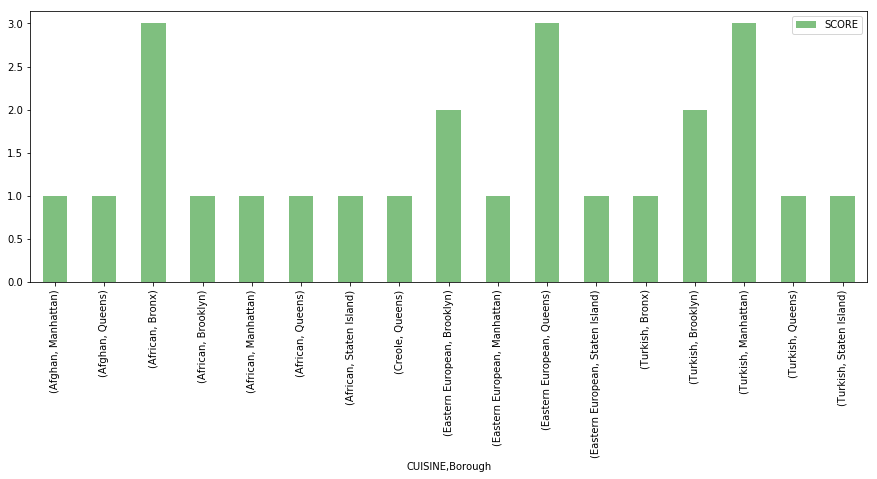

In [50]:
cluster_01 = cluster_0.groupby(['CUISINE','Borough']).nunique()
cluster_01[['SCORE']].plot.bar(alpha=0.5,cmap='ocean')

### Cluster 1 
Average Score 85

2 Restaurants

In [51]:
cluster_1=selection.loc[selection['Labels'] ==1]
print('Shape Cluster 1',cluster_1.shape)
cluster_1.head()

Shape Cluster 1 (2, 11)


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE,Labels
2683,Queens,Jamaica,11412.0,40.698096,-73.758990,MAGGY'S PATE KREYOL BAKERY,MURDOCK AVE,Creole,94.0,Not Yet Graded,1
7971,Brooklyn,Flatbush,11226.0,40.646448,-73.956649,THE LOFT BKNY RESTAURANT & LOUNGE,NOSTRAND AVE,Creole,76.0,Not Yet Graded,1


Amount of Restaurants by type of cuisine in cluster 1

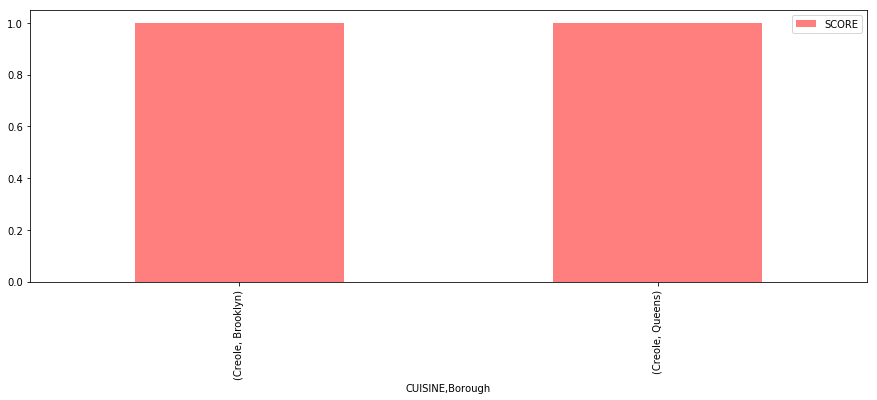

In [52]:
cluster_11 = cluster_1.groupby(['CUISINE','Borough']).nunique()
cluster_11[['SCORE']].plot.bar(alpha=0.5,cmap='prism')

### Cluster 2
Average Score 47

1 Restaurant

In [53]:
cluster_2=selection.loc[selection['Labels'] ==2]
print('Shape Cluster 2',cluster_2.shape)
cluster_2.head()

Shape Cluster 2 (38, 11)


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE,Labels
0,Bronx,Central Bronx,10453.0,40.852820,-73.912310,GALAGALA NY RESTAURANT,E 175TH ST,African,3.0,A,2
37,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,MB RESTAURANT,WEBSTER AVE,African,5.0,A,2
83,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CAKOR RESTAURANT,EAST 186 STREET,Eastern European,5.0,A,2
84,Bronx,Bronx Park and Fordham,10458.0,40.862529,-73.888159,CKA KA QELLU,HUGHES AVE,Eastern European,3.0,A,2
692,Brooklyn,Southern Brooklyn,11223.0,40.597143,-73.973426,NY SWEET SPOT CAFE,CONEY ISLAND AVE,Eastern European,2.0,A,2


Amount of Restaurants by type of cuisine in cluster 2

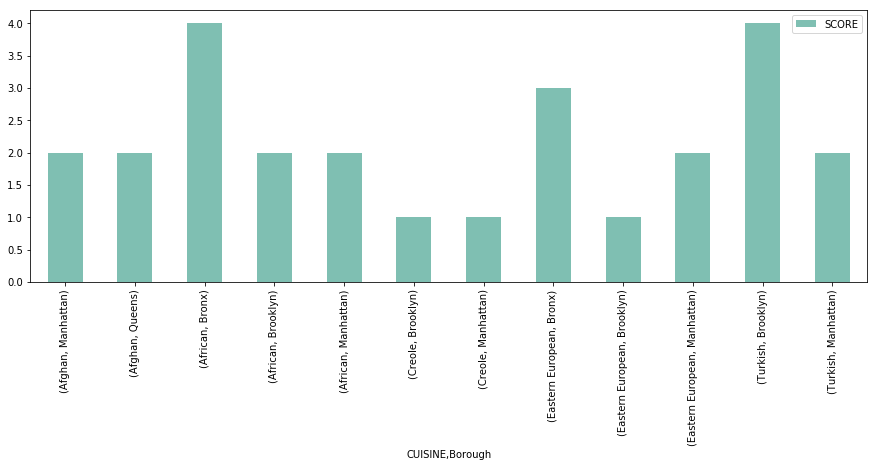

In [57]:
cluster_21 = cluster_2.groupby(['CUISINE','Borough']).nunique()
cluster_21[['SCORE']].plot.bar(alpha=0.5,cmap='summer')

### Cluster 3
Average Score 11

38 Restaurants

In [58]:
cluster_3=selection.loc[selection['Labels'] ==3]
print('Shape Cluster 3',cluster_3.shape)
cluster_3.head()

Shape Cluster 3 (1, 11)


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE,Labels
3259,Bronx,Central Bronx,10457.0,40.847162,-73.898663,OSEI-KROM,WEBSTER AVE,African,47.0,Not Yet Graded,3


Amount of Restaurants by type of cuisine in cluster 3

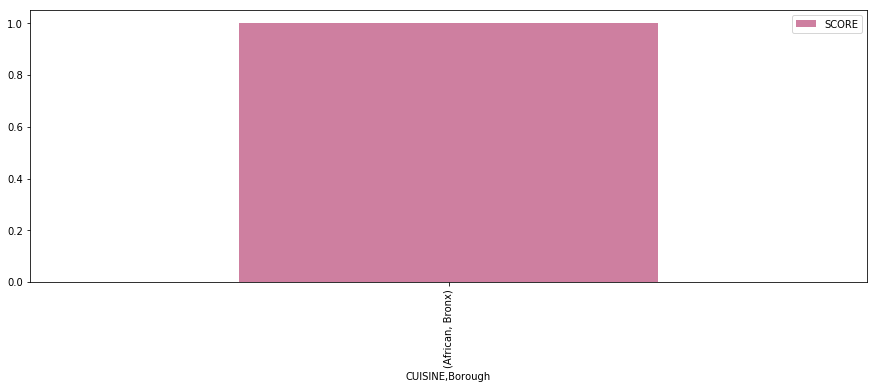

In [59]:
cluster_31 = cluster_3.groupby(['CUISINE','Borough']).nunique()
cluster_31[['SCORE']].plot.bar(alpha=0.5,cmap='Spectral')

### Cluster 4
Average Score 3.39

38 Restaurants

In [61]:
cluster_4=selection.loc[selection['Labels'] ==4]
print('Shape Cluster 4',cluster_4.shape)
cluster_4.head()

Shape Cluster 4 (40, 11)


,Borough,Neighborhood,ZIPCODE,LATITUDE,LONGITUDE,RESTAURANT,STREET,CUISINE,SCORE,GRADE,Labels
569,Brooklyn,Borough Park,11204.0,40.618777,-73.984831,Q S PALACE,65TH ST,Eastern European,9.0,A,4
690,Brooklyn,Southern Brooklyn,11223.0,40.597143,-73.973426,CAFE ARBAT,AVENUE U,Eastern European,7.0,A,4
691,Brooklyn,Southern Brooklyn,11223.0,40.597143,-73.973426,MSHOBLIURI/WE ARE GEORGIANS,KINGS HWY,Eastern European,7.0,A,4
741,Brooklyn,Southern Brooklyn,11223.0,40.597143,-73.973426,SAHARA RESTAURANT,CONEY ISLAND AVENUE,Turkish,7.0,A,4
2120,Manhattan,Lower East Side,10002.0,40.715776,-73.986211,CAFE KATJA,ORCHARD STREET,Eastern European,9.0,A,4


Amount of Restaurants by type of cuisine in cluster 4

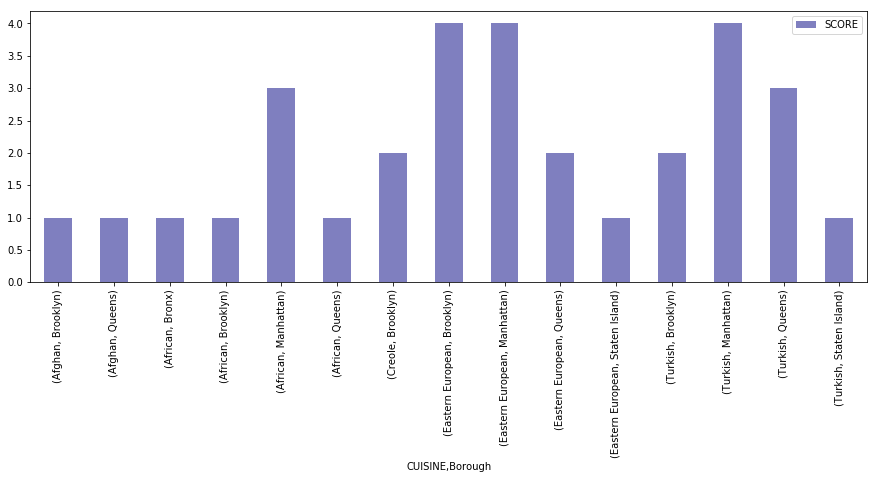

In [62]:
cluster_41 = cluster_4.groupby(['CUISINE','Borough']).nunique()
cluster_41[['SCORE']].plot.bar(alpha=0.5,cmap='jet')

### Boxplots Charts by Cluster

Text(0.5, 1.0, 'Cluster 4')

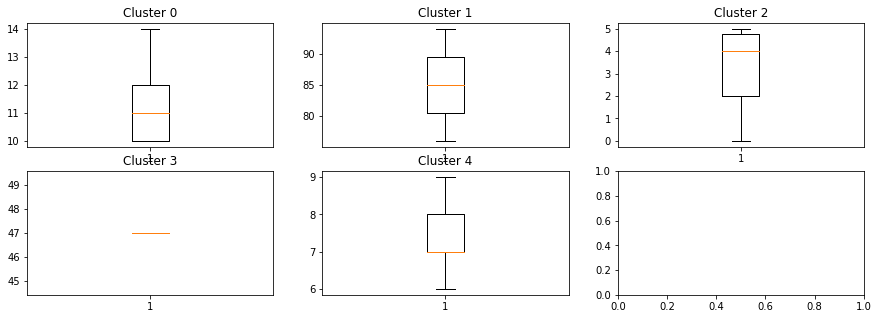

In [63]:
fig, axs = plt.subplots(2,3)

#Cluster 0
axs[0,0].boxplot(cluster_0.SCORE)
axs[0,0].set_title('Cluster 0')

#Cluster 1
axs[0,1].boxplot(cluster_1.SCORE)
axs[0,1].set_title('Cluster 1')

#Cluster 2
axs[0,2].boxplot(cluster_2.SCORE)
axs[0,2].set_title('Cluster 2')

#Cluster 3
axs[1,0].boxplot(cluster_3.SCORE)
axs[1,0].set_title('Cluster 3')

#Cluster 4
axs[1,1].boxplot(cluster_4.SCORE)
axs[1,1].set_title('Cluster 4')